<a href="https://colab.research.google.com/github/dasha-x/Apex-Zone-Predictor/blob/main/Apex_Circle_Predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Apex Ring Predictor**

#### Import globally needed packages

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import csv
import sklearn
import sklearn.model_selection
from google.colab.patches import cv2_imshow
import seaborn as sns # For dataset plotting
import warnings
from sklearn.model_selection import KFold # For K-fold cross validation

## **Introduction**

As previously explained in the project proposal, Apex Legends is a rising battle royale game that has gained a loyal following since its 2019 release. Most recently, coaches began exploring various data-mining techniques to determine the location of the last ring on the map. This information is extremely useful for professional playes, as good positioning can easily make or break their match.

My goal was to approach this problem from a machine learning perspective and use the techniques learned in class to build a model that was capable of predicting the center coordinate of the last ring (ring 4).

I used three models, namely linear regression, support vector regression and recurrent neural networks. The main challenge was collecting the data. Given that this is quite a new game and isn't as 'famous' as per example Dota, I couldn't find a collection of photos or coordinates of zone rings. With each game lasting about 20 minutes until it reaches the 4th circle, I spent quite some time (specifically 65 games) collecting my images.

As far as I'm concerned, there were no previous attempts at zone prediction regarding Apex Legends. Through my research, I did branch out into object trajectory research to get inspired at ways to approach the problem.


## **Methodology**

Before I could officially begin training and experimenting with my models, I had to collect my data. To do so, I collected some map screenshots while playing Apex Legends, specifically on the World's Edge map. Each data point in my dataset consists of 4 coordinates representing the (col, row) pixel position of the center of the circle.

In order to automate the process of finding the center coordinate, I used Hough Circle Transform which is a computer vision technique used for detecting circular shapes in an image.

Here is a brief overview of how the algorithm works:


*   Algorithm applies edge detection to the input image to identify potential circular boundaries.
*   Edge points generate a Hough space (parametric space) representing all possible circles that can pass through the edge points.
*   Algorithm searches the Hough space for the highest accumulator values, which represent the parameters of circles that best fit the edge points.

In order to detect the appropriate circle, I had to tweak parameters such as **param1**, **param2, minRadius and maxRadius**.

*   param1 refers to the threshold value for edge detection in the input image
*   param2 is the minimum number of votes required for a circle to be considered as a valid detection

Therefore, a higher value for param1 will reduce the number of considered edges, noticeably reducing noise and increasing processing speed. A higher value for param2 results in a higher detection threshold, which could reduce false positives but also miss the appropriate circle.

### Image Processing

*The code in this section demonstrates the methodology used to obtain my dataset values from the collected images. Most of these cells are meant to be ran once and won't work without connection to my personal google drive.*

In [ ]:
# Import required packages
from google.colab import drive
from google.colab.patches import cv2_imshow
import os
import cv2
import pandas as pd

In [ ]:
# Mount Google drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Crop Images and save to new folder in Drive

(Only needed to run once to get cropped images in desired directory)

In [ ]:
# Set path to directory containing images
image_dir = '/content/drive/MyDrive/Comp 432/APEX_Images_test'
save_dir = '/content/drive/MyDrive/Comp 432/APEX_images_cropped'

# Loop over all images in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.png'):
        # Load image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Crop image
        cropped_image = image[0:1016, 420:1436]

        # Save cropped image
        save_path = os.path.join(save_dir, filename[:-4] + '_cropped.jpg')
        cv2.imwrite(save_path, cropped_image)

#### Iterate through images and find the center of each circle

This code loops over all the images found in the 'APEX_images_cropped' directory, loads each image and applies the Hough Circle Transform algorithm to detect circles within the image.

The algorithm is applied with different parameters depending on the value of the 'ring' variable extracted from the filename of the image. The detected circles are checked for their radius, and if they satisfy the required condition, their coordinates, radius, and filename are appended to a list called X.

In addition, the circles are drawn to an output image and saved to a new directory called 'APEX_images_ring2'. If no circle is detected in an image, a tuple with zeros is appended to the X list for that image.

Saving each output image allowed me to make sure that the detected circle was in fact correct. This wasn't always the case, which is why a manual approach was later necessary to identify the missing circles.

In [ ]:
# Set path to directory containing images
image_dir = '/content/drive/MyDrive/Comp 432/APEX_images_cropped'
save_dir = '/content/drive/MyDrive/Comp 432/APEX_images_ring2'
X = []

# Loop over all images in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):

        # If multiple correct circles are found, append count to filename
        count = 0

        # Load image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        output = image.copy()
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        gray = cv2.medianBlur(gray, 3)

        ring = filename[3:5]

        if ring == 'R1':
          circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 50,
          param1=260, param2=60, minRadius=50, maxRadius=448)
        elif ring == 'R2':
          circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 50,
          param1=190, param2=65, minRadius=50, maxRadius=300)
        elif ring == 'R3':
          circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 30,
          param1=145, param2=65, minRadius=50, maxRadius=200)
        elif ring == 'R4':
          circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20,
          param1=120, param2=50, minRadius=5, maxRadius=76)

        if circles is not None:
          detected_circles = np.uint16(np.around(circles))
          for (x, y, r) in detected_circles[0, :]:
            # If the file extension maps to ring 1
            if ring == 'R1':
              if 263 < r < 275:
                # Keep count of multiple circles with valid radius
                count += 1
                # Append name, radius and coordinates to X
                X.append((filename[0:-4], r, x, y))
                # Draw circle and center point on output image
                cv2.circle(output, (x, y), r, (0, 0, 0), 3)
                cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
                # Save output image to 'APEX_images_rings'
                save_path = os.path.join(save_dir, filename[:-4] + '_' + str(count) + '.jpg')
                cv2.imwrite(save_path, output)
            # If the file extension maps to ring 2
            elif ring == 'R2':
              if 139 < r < 150:
                count += 1
                X.append((filename[0:-4], r, x, y))
                cv2.circle(output, (x, y), r, (0, 0, 0), 3)
                cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
                save_path = os.path.join(save_dir, filename[:-4] + '_' + str(count) + '.jpg')
                cv2.imwrite(save_path, output)
            # If the file extension maps to ring 3
            elif ring == 'R3':
              if 80 < r < 95:
                count += 1
                X.append((filename[0:-4], r, x, y))
                cv2.circle(output, (x, y), r, (0, 0, 0), 3)
                cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
                save_path = os.path.join(save_dir, filename[:-4] + '_' + str(count) + '.jpg')
                cv2.imwrite(save_path, output)
            # If the file extension maps to ring 4
            elif ring == 'R4':
              if 40 < r < 50:
                count += 1
                X.append((filename[0:-4], r, x, y))
                cv2.circle(output, (x, y), r, (0, 0, 0), 3)
                cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
                save_path = os.path.join(save_dir, filename[:-4] + '_' + str(count) + '.jpg')
                cv2.imwrite(save_path, output)
        if circles is None:
          X.append((filename[0:-4], 0, 0, 0))

Once I obtained the list of circles, I exported the sorted contents in a csv file to allow for verification alongside the photos.

In [ ]:
X_sorted = sorted(X, key=lambda x: x[0])

with open('X_sorted2.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for row in X_sorted:
        writer.writerow(row)

After going through the pictures, I cleaned up the csv file from wrong and missing circle detections and saved the cleaned dataset in 'X_cleaned.csv'.

In [ ]:
filename = '/content/drive/MyDrive/Comp 432/X_cleaned.csv'
X_cleaned = []

# Open the CSV file and read its content
with open(filename, 'r') as csv_file:
    csv_reader = csv.reader(csv_file)
    for row in csv_reader:
        X_cleaned.append(row)

# Print the content of the CSV file
for row in X_cleaned:
    print(row)

At this point, the parameters of the algorithm couldn't be optimally tweaked to perfectly detect the circles from each image. For about 15 pictures, I had to manually load the image and tweak the parameters until the algorithm properly detected the circle.

The commented out code shows some different versions of parameters that worked for certain images.

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Comp 432/APEX_images_cropped/47_R1_03-13_cropped.jpg')
output = img.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.medianBlur(gray, 3)

filename = "47_R1_03-13_cropped.jpg"
ring = filename[3:5]

if ring == 'R1':
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 50,
  # param1=99, param2=150, minRadius=50, maxRadius=450)
  circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 100,
  param1=345, param2=40, minRadius=50, maxRadius=450)
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 50,
  # param1=230, param2=55, minRadius=50, maxRadius=448)
elif ring == 'R2':
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 50,
  # param1=190, param2=65, minRadius=50, maxRadius=300)
  circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 45,
  param1=230, param2=40, minRadius=50, maxRadius=200)
elif ring == 'R3':
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20,
  # param1=35, param2=130, minRadius=50, maxRadius=200)
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 30,
  # param1=310, param2=40, minRadius=50, maxRadius=200)
  circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 30,
  param1=150, param2=55, minRadius=50, maxRadius=200)
elif ring == 'R4':
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20,
  # param1=90, param2=50, minRadius=5, maxRadius=76)
  # circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20,
  # param1=30, param2=80, minRadius=5, maxRadius=76)
  circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 20,
  param1=20, param2=60, minRadius=5, maxRadius=62)

if circles is not None:
  detected_circles = np.uint16(np.around(circles))
  for (x, y, r) in detected_circles[0, :]:
    if ring == 'R1':
      if 263 < r < 275:
        cv2.circle(output, (x, y), r, (0, 0, 0), 3)
        cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
    elif ring == 'R2':
      if 139 < r < 150:
        cv2.circle(output, (x, y), r, (0, 0, 0), 3)
        cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
    elif ring == 'R3':
      if 80 < r < 100:
        cv2.circle(output, (x, y), r, (0, 0, 0), 3)
        cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
    elif ring == 'R4':
      if 40 < r < 50:
        cv2.circle(output, (x, y), r, (0, 0, 0), 3)
        cv2.circle(output, (x, y), 2, (0, 255, 255), 3)
if circles is None:
    print("None")

In [ ]:
cv2.circle(output, (596, 520), r, (0, 0, 0), 3)
cv2.circle(output, (596, 520), 2, (0, 255, 255), 3);

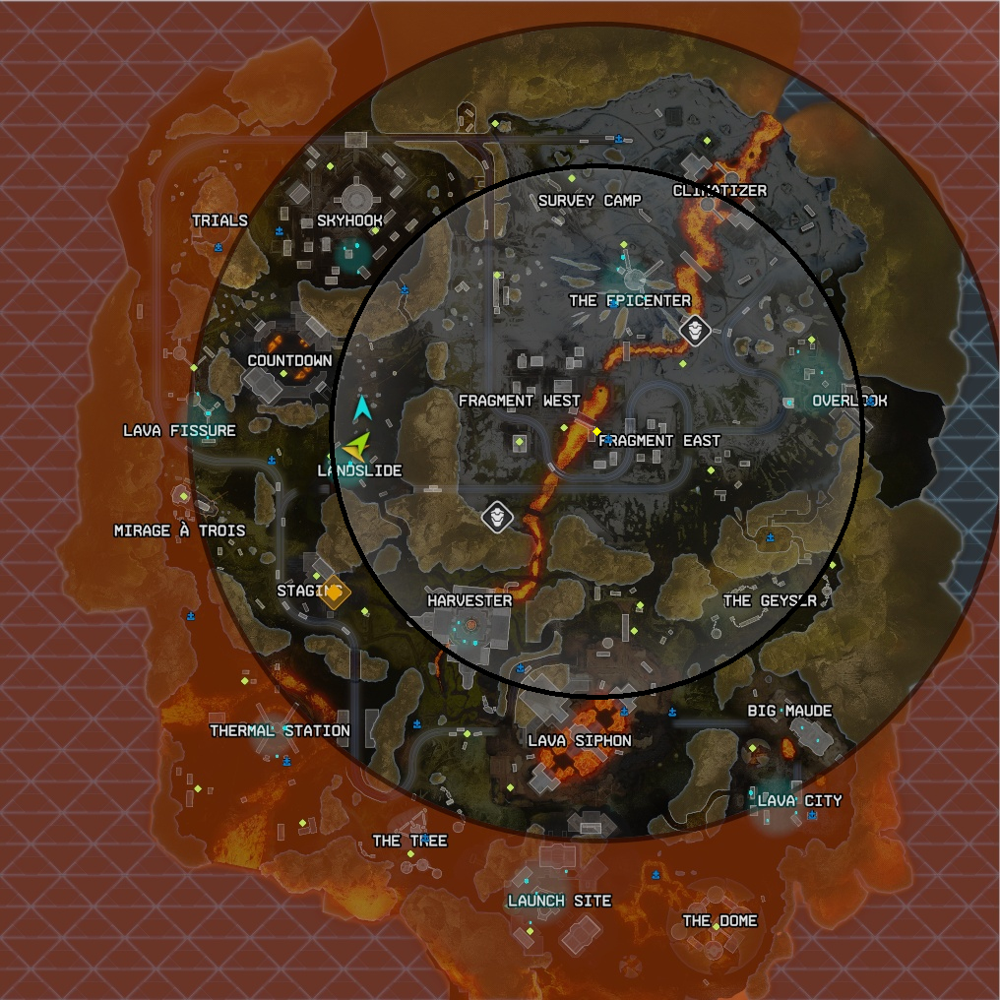

In [ ]:
cv2_imshow(output)

Once the algorithm succesfully identified the circle, I saved the image in the directory along with the other images and appended the coordinates to 'X_cleaned'.

In [ ]:
save_dir = '/content/drive/MyDrive/Comp 432/APEX_images_ring2'
X_cleaned.append((filename[0:-4], r, x, y))
save_path = os.path.join(save_dir, filename[:-4] + '_' + str(1) + '.jpg')
cv2.imwrite(save_path, output)

True

After concluding this process, I saved the data in a 'data.csv' file to allow for easy access each time. This data is available and should be downloaded to run the rest of the code.

In [ ]:
# Save the data to data.csv as a local file
with open('data.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for row in X_cleaned:
        writer.writerow(row)

In [ ]:
!gdown 1RaHTmbRAJi_EvBdUMql03BQLc8DMRfqG # data.csv dataset
!gdown 1jnaib-TKxvRRj-8a9CUpPkQxO6ttiQlh # blank map

Downloading...
From: https://drive.google.com/uc?id=1RaHTmbRAJi_EvBdUMql03BQLc8DMRfqG
To: /content/data.csv
100% 8.19k/8.19k [00:00<00:00, 10.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1jnaib-TKxvRRj-8a9CUpPkQxO6ttiQlh
To: /content/blank_map.png
100% 1.68M/1.68M [00:00<00:00, 133MB/s]


## **Experimental Setup**

Describe the datasets used for your experiments. List the machine learning techniques used to solve your problem and report the corresponding hyperparameters.

In this section, you can add **text**, **tables**, and **figures**.
________


#### Dataset

Based on the data collection described in the methodology, the image below illustrates the distribution of all the ring 4 circles found in the dataset, where the red point shows the true center of each ring.

*Disregard the green dots, as they are actual green dots found on the game map.*

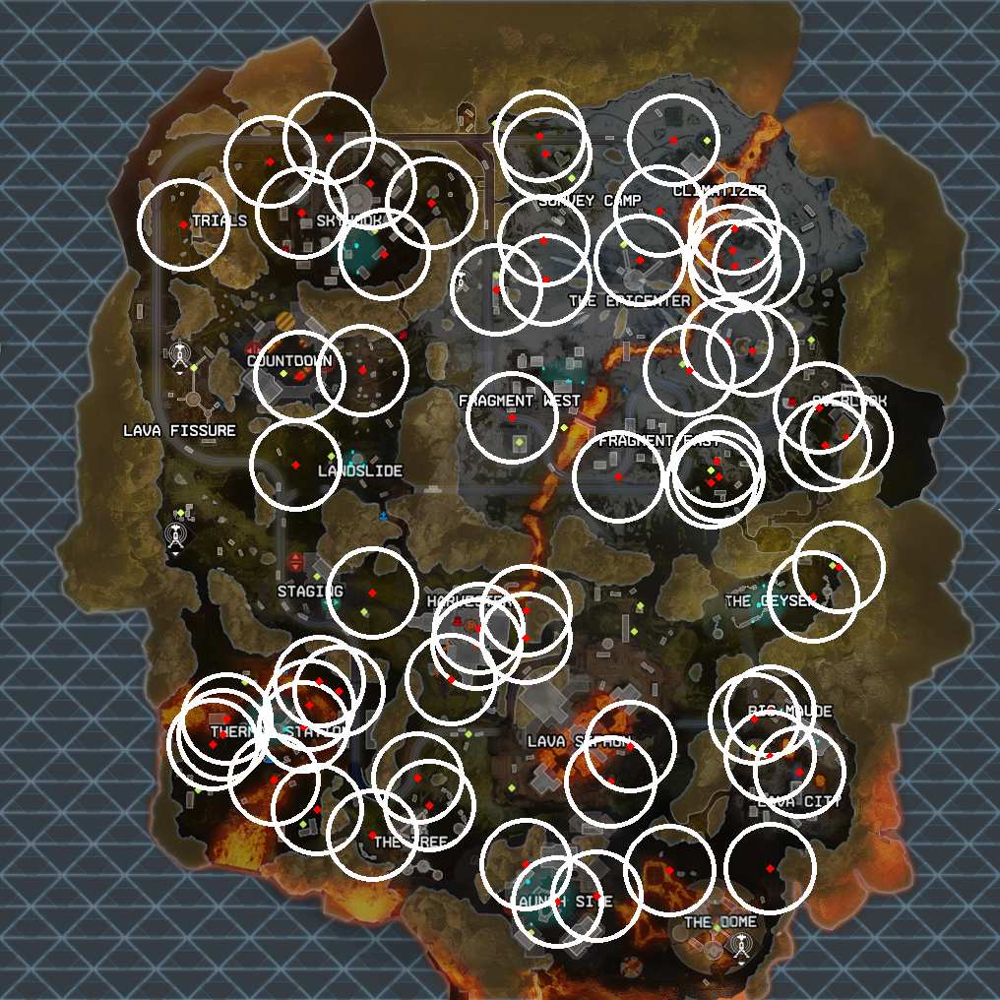

In [ ]:
img = cv2.imread('/content/blank_map.png')
output = img.copy()

r = 45

y_data = y.reshape(y.shape[0], -1)

for row in range(len(y_data)):
  x = y_data[row][0]
  y = y_data[row][1]
  cv2.circle(output, (x, y), 45, (255, 255, 255), 3);
  cv2.circle(output, (x, y), 2, (0, 0, 255), 3);

cv2_imshow(output)

In [ ]:
X, y = generate_dataset()

X = torch.cat((X, y), 1)

cols = np.array(['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4'])

df = pd.DataFrame(X.reshape(65, 8), columns=cols)

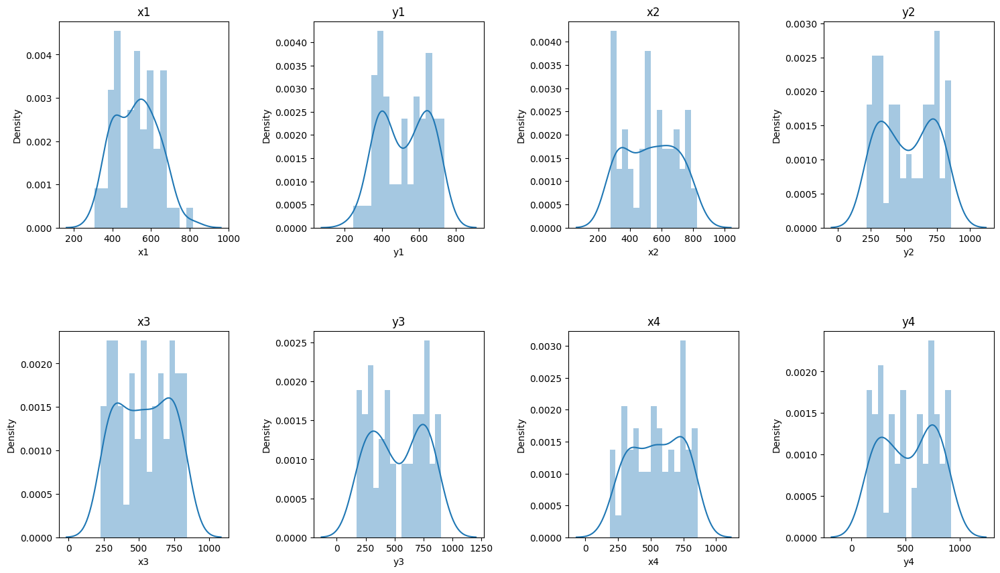

In [ ]:
warnings.filterwarnings('ignore')

# graph size
plt.figure(1, figsize = (18, 10))
graph = 0

for x in cols:
    graph += 1

    # ploting each graph
    plt.subplot(2 , 4, graph)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.distplot(df[x] , bins = 15);
    plt.title('{}'.format(x))
# displaying the graph
plt.show();

#### Models

Initially, I was interested in doing a classication problem to identify which part of the map a circle might end up in. However, after working and looking at the dataset, I decided not to follow that approach because the first ring already points towards the general direction of the final ring.

From a player point of view this is common knowledge observed from experience, so I figured that a classification approach wouldn't give me as much benefit as a regression approach. Indeed, identifying the center coordinate of the circle with precision gives much more valuable information during the game.

I decided to compare three different machine learning algorithms to identify the center coordinate of the fourth circle. Based on my limited dataset, I chose algorithms that were simple enough to work with a smaller number of data points. I approached my problem with:

*   Linear Regression
*   Support Vector Regression
*   RNN

## **Experimental Results**

Describe here the main experimental results. Critically discuss them. Compare them with results available in the literature (if applicable).

In this section, you can add **text** and **figures**, **tables**, **plots**, and code. Make sure the code is runnable and replicable.

Upon comparing the three machine learning models mentionned above,




Common function adapted to be used by all 3 models to generate the dataset:

In [ ]:
def generate_dataset():
  filename = 'data.csv'
  data_list = []

  # Open the CSV file and read its content
  with open(filename, 'r') as csv_file:
      csv_reader = csv.reader(csv_file)
      for row in csv_reader:
          data_list.append(row)

  # Transform the list to a numpy array
  data = np.array(data_list)

  # Reshape the array to a matrix
  data = np.reshape(data, (65, 4, 4))

  data = np.delete(data, [0, 1], axis=2)

  data = data.astype(int)

  cols = np.array(['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4'])

  df = pd.DataFrame(data.reshape(65, 8), columns=cols)

  X_df = df[['x1', 'y1', 'x2', 'y2', 'x3', 'y3']]
  y_df = df[['x4', 'y4']]

  X = torch.tensor(X_df.values).float()
  y = torch.tensor(y_df.values).float()
  return X, y

### 1 - Linear Regression

In [ ]:
# Import the required packages
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import pandas as pd
import math
import torch
from sklearn.model_selection import KFold # For K-fold cross validation

In [ ]:
# Generate dataset
X, y = generate_dataset()

In [ ]:
# Create a linear regression model and fit it to the training data
model = LinearRegression()

#### Data Split and Normalization

In [ ]:
# Splitting the train and test data
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=0)

In [ ]:
# Create two instances of a StandardScaler and fit it to X_train and y_train
scaler_X = StandardScaler().fit(X_train)
scaler_y = StandardScaler().fit(y_train)

# Normalize the data with the scaler
X_train = scaler_X.transform(X_train)
y_train = scaler_y.transform(y_train)
X_test = scaler_X.transform(X_test)
y_test = scaler_y.transform(y_test)

In [ ]:
# Create a linear regression model and fit it to the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the performance of the model using the mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
score = r2_score(y_test, y_pred)
print("Mean squared error: ", mse)
print("Mean absolute error: ", mae)
print("r2 score: ", score)

Mean squared error:  0.017914516030723387
Mean absolute error:  0.11322923880229174
r2 score:  0.9764532409064066


#### Linear Regression K-Fold Cross-Validation

Because my dataset is so small, I wanted to make sure that the performance metrics were more representative of the actual dataset. I decided to perform K-fold cross validation using the scikit-learn library.

In [ ]:
# fix random seed for reproducibility
seed = 0

metrics = []

# define 10-fold cross validation test harness
kfold = KFold(n_splits=5, shuffle=True, random_state=seed)
model = LinearRegression()

count = 1

# Training loop
# for i in range(kfold.get_n_splits(X)):
for train, test in kfold.split(X_train, y_train):

  # Create a linear regression model and fit it to the training data
  model.fit(X_train[train], y_train[train])

  # Make predictions on the test data
  y_pred = model.predict(X_train[test])

  mse = mean_squared_error(y_train[test], y_pred)
  mae = mean_absolute_error(y_train[test], y_pred)
  score = r2_score(y_train[test], y_pred)
  metrics.append([count, round(mse, 4), round(mae, 4), round(score, 4)])
  count += 1

#### Performance Metrics

The dataframe below shows the computed mean squared error (MSE), the mean average error (MAE) and the R2 score.

Based on the values obtained, we can say that a Linear Regression model does a very good job at describing the variance of the target variable (4th coordinate) using the input variables (first 2 coordinates).

In [ ]:
from tabulate import tabulate

df = pd.DataFrame({'MSE': [i[1] for i in metrics], 'MAE': [i[2] for i in metrics],
                   'R2 score': [i[3] for i in metrics]}, index=['1st Fold', '2nd Fold', '3rd Fold', '4th Fold', '5th Fold'])

df.T

,1st Fold,2nd Fold,3rd Fold,4th Fold,5th Fold
MSE,0.0170,0.0140,0.0101,0.0082,0.0153
MAE,0.0931,0.0975,0.0819,0.0731,0.0964
R2 score,0.9763,0.9865,0.9786,0.9935,0.9784


#### Linear Regression Testing

In [ ]:
# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the performance of the model using the mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
score = r2_score(y_test, y_pred)
print("Mean squared error: ", mse)
print("Mean absolute error: ", mae)
print("r2 score: ", score)

Mean squared error:  0.01932172072597123
Mean absolute error:  0.11709441146622124
r2 score:  0.9746289807640129


In order to get a better idea of the predictions made by the model, I printed below the coordinates found in the testing set.

'X_test' represents the first 3 coordinates, the 'y_test' represents the target coordinate and the 'y_pred' represents the coordinates predicted by the model in pixels.

In [ ]:
X_test_unscaled = scaler_X.inverse_transform(X_test)
y_test_unscaled = scaler_y.inverse_transform(y_test)
y_pred_unscaled = scaler_y.inverse_transform(y_pred)

print('X_test:\n {}\ny_test:\n {}\ny_pred:\n {}'.format(X_test_unscaled[0:10], y_test_unscaled[0:10], y_pred_unscaled[0:10]))

X_test:
 [[388. 358. 366. 236. 346. 182.]
 [382. 582. 288. 664. 292. 706.]
 [582. 636. 620. 754. 668. 764.]
 [524. 354. 590. 246. 580. 192.]
 [414. 454. 392. 332. 370. 290.]
 [580. 402. 682. 332. 728. 328.]
 [560. 706. 614. 818. 648. 862.]
 [726. 246. 316. 316. 310. 262.]
 [376. 570. 362. 540. 360. 588.]
 [410. 524. 290. 510. 298. 458.]]
y_test:
 [[334. 140.]
 [324. 692.]
 [640. 758.]
 [554. 156.]
 [390. 258.]
 [744. 254.]
 [680. 884.]
 [306. 216.]
 [378. 602.]
 [300. 472.]]
y_pred:
 [[350.93908222 157.97558146]
 [282.35740529 699.19690498]
 [690.48341782 768.6784975 ]
 [597.15505237 177.86536408]
 [377.7932566  272.28335858]
 [754.29723799 309.33348122]
 [666.98827516 868.6088388 ]
 [270.89679342 291.42892454]
 [359.82197596 570.85462221]
 [303.24302154 446.45209591]]


#### Plotting Predictions

Based on the predicted values, I have plotted the final rings with their true center (red dot) and the predicted center (pink dot).

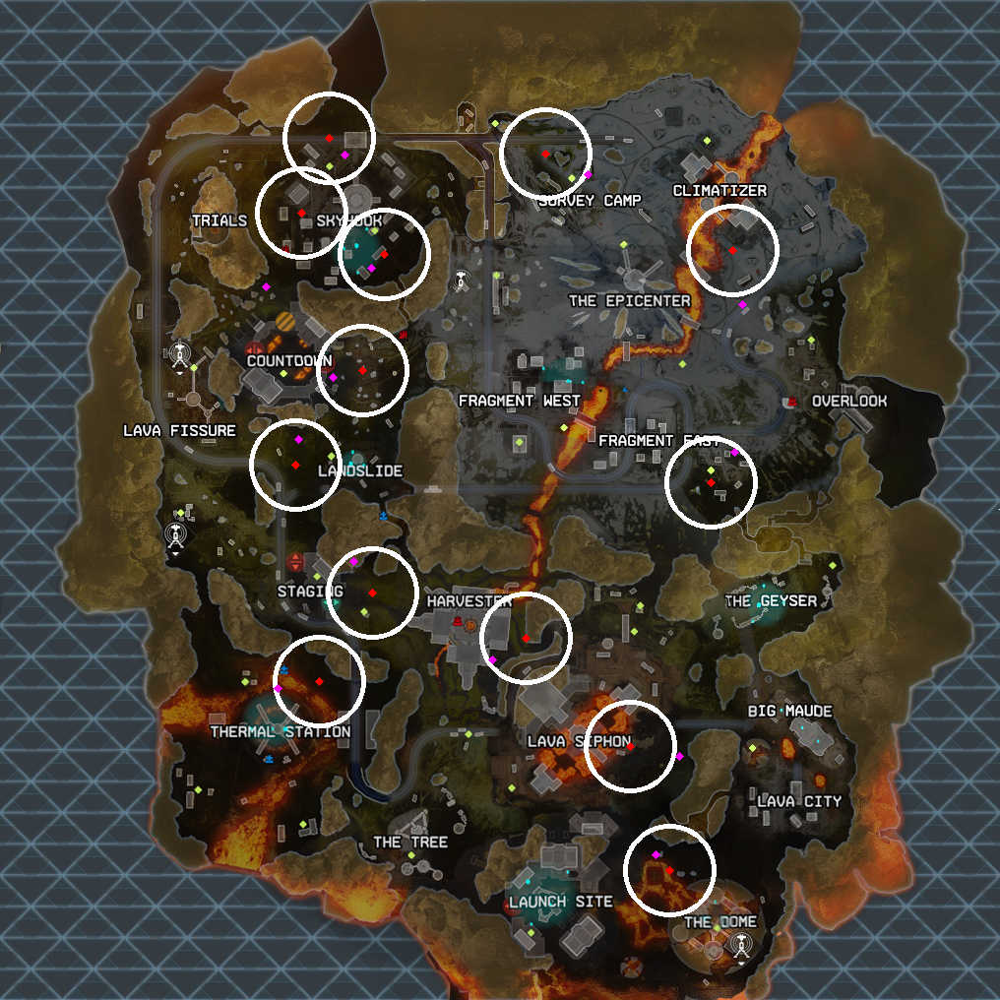

In [ ]:
img = cv2.imread('/content/blank_map.png')
output = img.copy()

r = 45
count = 0

for index, element in y_test:
  x = int(y_test_unscaled[count][0])
  y = int(y_test_unscaled[count][1])
  x_t = int(y_pred_unscaled[count][0])
  y_t = int(y_pred_unscaled[count][1])
  cv2.circle(output, (x, y), 45, (255, 255, 255), 3);
  cv2.circle(output, (x, y), 2, (0, 0, 255), 3);
  cv2.circle(output, (x_t, y_t), 2, (255, 0, 255), 3);
  count += 1

cv2_imshow(output)

#### Alternative Model

I wanted to explore the model even more and see if it would have a better performance with predicting coordinates x and y independently. I didn't use K-fold cross-validation and obtained very similar results as the initial linear model done without cross-validation.

I got this idea from [this article](https://medium.com/analytics-vidhya/predicting-common-movement-b225569bee91) that explored common movement trajectories of object in a 2D grid.



Generate the dataset split by x and y coordinates:

In [ ]:
filename = 'data.csv'
data_list = []

# Open the CSV file and read its content
with open(filename, 'r') as csv_file:
    csv_reader = csv.reader(csv_file)
    for row in csv_reader:
        data_list.append(row)

# Transform the list to a numpy array
data = np.array(data_list)

# Reshape the array to a matrix
data = np.reshape(data, (65, 4, 4))

data = np.delete(data, [0, 1], axis=2)

data = data.astype(int)

lable_one = np.array(['1', '2', '3', '4'])
lable_two = np.array(['x', 'y'])
cols = pd.MultiIndex.from_product([lable_one, lable_two])

cols = np.array(['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4'])

df = pd.DataFrame(data.reshape(65, 8), columns=cols)

X_df_x = df[['x1', 'x2', 'x3']]
X_df_y = df[['y1', 'y2', 'y3']]
y_df_x = df[['x4']]
y_df_y = df[['y4']]

In [ ]:
# Splitting the train and test data

X_dfx_train, X_dfx_test, y_dfx_train, y_dfx_test = sklearn.model_selection.train_test_split(X_df_x, y_df_x, train_size=0.8, test_size=0.2, random_state=0)
X_dfy_train, X_dfy_test, y_dfy_train, y_dfy_test = sklearn.model_selection.train_test_split(X_df_y, y_df_y, train_size=0.8, test_size=0.2, random_state=0)

In [ ]:
# Create two instances of a StandardScaler and fit it to X_train and y_train
scaler_X_dfx = StandardScaler().fit(X_dfx_train)
scaler_y_dfx = StandardScaler().fit(y_dfx_train)

scaler_X_dfy = StandardScaler().fit(X_dfy_train)
scaler_y_dfy = StandardScaler().fit(y_dfy_train)

# Normalize the x data with the scaler
X_dfx_train = scaler_X_dfx.transform(X_dfx_train)
y_dfx_train = scaler_y_dfx.transform(y_dfx_train)
X_dfx_test = scaler_X_dfx.transform(X_dfx_test)
y_dfx_test = scaler_y_dfx.transform(y_dfx_test)

# Normalize the y data with the scaler
X_dfy_train = scaler_X_dfy.transform(X_dfy_train)
y_dfy_train = scaler_y_dfy.transform(y_dfy_train)
X_dfy_test = scaler_X_dfy.transform(X_dfy_test)
y_dfy_test = scaler_y_dfy.transform(y_dfy_test)

#### Alternative Model Testing

In [ ]:
# Create a linear regression model and fit it to the training data
model_x = LinearRegression()
model_y = LinearRegression()
model_x.fit(X_dfx_train, y_dfx_train)
model_y.fit(X_dfy_train, y_dfy_train)

# Make predictions on the test data
y_dfx_pred = model_x.predict(X_dfx_test)
y_dfy_pred = model_y.predict(X_dfy_test)

# Evaluate the performance of the model using the mean squared error (MSE)
mse_dfx = mean_squared_error(y_dfx_test, y_dfx_pred)
mae_dfx = mean_absolute_error(y_dfx_test, y_dfx_pred)
score_dfx = r2_score(y_dfx_test, y_dfx_pred)
print("Mean squared error: ", mse_dfx)
print("Mean absolute error: ", mae_dfx)
print("r2 score: ", score_dfx)

mse_dfy = mean_squared_error(y_dfy_test, y_dfy_pred)
mae_dfy = mean_absolute_error(y_dfy_test, y_dfy_pred)
score_dfy = r2_score(y_dfy_test, y_dfy_pred)
print("Mean squared error: ", mse_dfy)
print("Mean absolute error: ", mae_dfy)
print("r2 score: ", score_dfy)

Mean squared error:  0.017865917683682116
Mean absolute error:  0.11851821037554525
r2 score:  0.9733569993015543
Mean squared error:  0.010319403960116892
Mean absolute error:  0.08609054252986353
r2 score:  0.9888088725307227


### 2 - SVR

My second algorithm of choice was an SVR, because I initially wasn't sure if the relationship between the input variables was linear or more complex. I wanted to explore SVR's in case there were complex patterns in the data that could map the input variables to a high-dimensional feature space.

This model further confirmed that the relationship was in fact linear, but I decided to include the model in my report.

In [ ]:
# Import necessary packages
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Visualizations
import plotly.graph_objects as go # for data visualization
import plotly.express as px # for data visualization

Explain choice of kernel here:

In [ ]:
# Call to function to generate dataset
X, y = generate_dataset()

#### Data Split and Normalization

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
# Generate scaler to fit data
scaler_X = StandardScaler().fit(X_train)
scaler_y = StandardScaler().fit(y_train)

# Transform data
X_train = scaler_X.transform(X_train)
y_train = scaler_y.transform(y_train)
X_test = scaler_X.transform(X_test)
y_test = scaler_y.transform(y_test)

In [ ]:
# Creating the SVR model
from sklearn.multioutput import MultiOutputRegressor

regressor = MultiOutputRegressor(SVR(kernel='linear'))

#### SVR K-Fold Cross-Validation

In [ ]:
# fix random seed for reproducibility
seed = 0

metrics = []

# define 5-fold cross validation
kfold = KFold(n_splits=5, shuffle=True, random_state=seed)

count = 1

# Kfold loop
for train, test in kfold.split(X_train, y_train):

  regressor.fit(X_train[train], y_train[train])
  y_pred = regressor.predict(X_train[test])

  mse = mean_squared_error(y_train[test], y_pred)
  mae = mean_absolute_error(y_train[test], y_pred)
  score = r2_score(y_train[test], y_pred)
  metrics.append([count, round(mse, 4), round(mae, 4), round(score, 4)])
  count += 1

#### Performance Metrics

In [ ]:
from tabulate import tabulate

measure_comp = pd.DataFrame(metrics, columns=['K-fold', 'MAE', 'MSE', 'R2 score'])

df = pd.DataFrame({'MSE': [i[1] for i in metrics], 'MAE': [i[2] for i in metrics],
                   'R2 score': [i[3] for i in metrics]}, index=['1st Fold', '2nd Fold', '3rd Fold', '4th Fold', '5th Fold'])

df.T

,1st Fold,2nd Fold,3rd Fold,4th Fold,5th Fold
MSE,0.0152,0.0206,0.0094,0.0093,0.0149
MAE,0.0929,0.1184,0.0773,0.0777,0.0956
R2 score,0.9796,0.9801,0.9826,0.9925,0.9798


#### SVR Testing

In [ ]:
y_pred = regressor.predict(X_test)

mse_dfx = mean_squared_error(y_test, y_pred)
mae_dfx = mean_absolute_error(y_test, y_pred)
score_dfx = r2_score(y_test, y_pred)
print("Mean squared error: ", mse_dfx)
print("Mean absolute error: ", mae_dfx)
print("r2 score: ", score_dfx)

Mean squared error:  0.018139351737073105
Mean absolute error:  0.11568107277455866
r2 score:  0.9759407398820793


In [ ]:
X_test_unscaled = scaler_X.inverse_transform(X_test)
y_test_unscaled = scaler_y.inverse_transform(y_test)
y_pred_unscaled = scaler_y.inverse_transform(y_pred)

print('X_test:\n {}\ny_test:\n {}\ny_pred:\n {}'.format(X_test_unscaled[0:10], y_test_unscaled[0:10], y_pred_unscaled[0:10]))

X_test:
 [[388. 358. 366. 236. 346. 182.]
 [382. 582. 288. 664. 292. 706.]
 [582. 636. 620. 754. 668. 764.]
 [524. 354. 590. 246. 580. 192.]
 [414. 454. 392. 332. 370. 290.]
 [580. 402. 682. 332. 728. 328.]
 [560. 706. 614. 818. 648. 862.]
 [726. 246. 316. 316. 310. 262.]
 [376. 570. 362. 540. 360. 588.]
 [410. 524. 290. 510. 298. 458.]]
y_test:
 [[334. 140.]
 [324. 692.]
 [640. 758.]
 [554. 156.]
 [390. 258.]
 [744. 254.]
 [680. 884.]
 [306. 216.]
 [378. 602.]
 [300. 472.]]
y_pred:
 [[347.32601269 164.50591154]
 [275.32182151 693.95927225]
 [679.87207391 765.07153286]
 [597.58497022 180.1134436 ]
 [372.35526795 279.40671643]
 [746.82594063 309.98641973]
 [657.38181433 863.11679491]
 [283.65881469 271.63228772]
 [351.58269071 570.48792365]
 [290.82723476 454.19813369]]


#### 3D scatterplot of variables x1, x2 and x4

Given the nature of SVR models, I wanted to illustrate the prediction plane of my dataset. In order to graph it, I represented the relationship of the x coordinates from ring 1, 2 and 4. The data visualization algorithms were taken from [this article](https://towardsdatascience.com/support-vector-regression-svr-one-of-the-most-flexible-yet-robust-prediction-algorithms-4d25fbdaca60) that presented various methods of graphing SVR's.

In [ ]:
df

fig = px.scatter_3d(df, x=df['x1'], y=df['x2'], z=df['x4'], opacity=0.8,
                    color_discrete_sequence=['black'],
                    height=900, width=1000)

fig.update_traces(marker=dict(size=3))

In [ ]:
# Select variables
X_dfx = df[['x1', 'x2']]
y_dfx = df['x4']

# Model fitting
model_dfx = SVR(kernel='linear')
model_dfx.fit(X_dfx, y_dfx)

SVR(kernel='linear')

Necessary steps for creating a prediction plane to be used in the visualization

In [ ]:
# Set Increments between points in a meshgrid
mesh_size = 1

# Identify min and max values for input variables
x_min, x_max = X_dfx['x1'].min(), X_dfx['x1'].max()
y_min, y_max = X_dfx['x2'].min(), X_dfx['x2'].max()

# Return evenly spaced values based on a range between min and max
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)

# Create a meshgrid
xx, yy = np.meshgrid(xrange, yrange)

#### Graphing Prediction Plane

In [ ]:
# Use models to create a prediciton plane --- SVR
pred_svr = model_dfx.predict(np.c_[xx.ravel(), yy.ravel()])
pred_svr = pred_svr.reshape(xx.shape)

In [ ]:
# Create a 3D scatter plot with predictions
fig = px.scatter_3d(df, x=df['x1'], y=df['x2'], z=df['x4'],
                    opacity=0.8, color_discrete_sequence=['black'],
                    width=1000, height=900
                   )

# Set figure title and colors
fig.update_layout(title_text="Scatter 3D Plot with SVR Prediction Surface")

# Update marker size
fig.update_traces(marker=dict(size=2))

# Add prediction plane
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred_svr, name='SVR',
                          colorscale=px.colors.sequential.Sunsetdark,
                          showscale=False))

fig.show()

### 3 - RNN

For the RNN model, I decided to approach the problem as an autoregressive RNN situation like in a time series, because in a real world situation that could make this model useful, it would be even more ideal that the trained model predict the final circle if it only had the coordinate of the first one, not the first three.

Instead of training the model under the assumption that it has all 3 coordinates, I got inspired by the sinusoid prediction example in lab 6.

In [ ]:
# Importing required packages
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import mean_squared_error

Start by generating the dataset:

In [ ]:
# Call to function to generate dataset
X, y = generate_dataset()

In [ ]:
X = torch.cat((X, y), 1)

X = torch.reshape(X, (65, 4, 2))

# Printing the shape of the dataset
print(X.shape)
print(y.shape)

torch.Size([65, 4, 2])
torch.Size([65, 2])


#### Data Split and Normalization

In [ ]:
# Reshape X for data split
X = torch.reshape(X, (65, 8))

# Split the data into training and testing sets
X_train, X_test = sklearn.model_selection.train_test_split(X, test_size=0.2, random_state=0)

# Fit the scaler to the training set
scaler = StandardScaler().fit(X_train)

# Normalize data
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# Convert to tensors
X_train = torch.tensor(X_train).float()
X_test = torch.tensor(X_test).float()

# Reshape back to 3 dimensions
X_train = torch.reshape(X_train, (52, 4, 2))
X_test = torch.reshape(X_test, (13, 4, 2))

#### Model

In [ ]:
class myRnn(torch.nn.Module, BaseEstimator, ClassifierMixin):
  def __init__(self, input_size=2, output_size=2, hidden_size=4, num_layers=1, lr=0.01):
    super(myRnn, self).__init__()
    self.input_size=input_size
    self.output_size=output_size
    self.num_layers=num_layers
    self.hidden_size=hidden_size
    self.lr=lr
    self.rnn = torch.nn.RNN(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers)
    self.fc = torch.nn.Linear(hidden_size, output_size)

  def forward(self, x):
    r, h = self.rnn(x)
    y = self.fc(r)
    return y


  def predict(self, x):
    with torch.no_grad():
      out = self.rnn(x)
    return out

  def fit(self, X, Y, num_epochs, lr):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.SGD(self.parameters(), lr=lr)
    loss_list = []

    # Remove the last time steps from X and Y
    X = X[:, 0:-1]
    Y = Y[:, 0:-1]

    N = X.shape[0]

    for e in range(num_epochs):
      for i in range(0, N):

        output = self(X[i])
        loss = criterion(output, Y[i])

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

      if (e + 1) % 50 == 0:
        print("Epoch %03d: Train_loss: %.4f " %(e+1, loss.item()))


    def get_params(self, deep=True):
        return {'input_size': self.input_size, 'hidden_size': self.hidden_size,
                'num_epochs': self.num_epochs,
                'lr': self.lr}

In [ ]:
input_size = X_train.shape[-1]
output_size = input_size
hidden_size = 10
num_layers = 2
loss_list = []
lr_grid = np.array([1.0, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001])
batch_size = 15

# Model and Objective Function Initialization
rnn = myRnn(input_size, output_size, hidden_size, num_layers)
loss_mse = torch.nn.MSELoss()
loss_mae = torch.nn.L1Loss()

opt = torch.optim.Adam(rnn.parameters(), lr=0.05)
n_epochs = 500


def training_loop(X, model, loss_mse, loss_mae, optimizer, num_epoch=n_epochs):

  loss_list = []

  # Derive labels by shifting X
  Y = torch.roll(X, -1, dims=1)

  # Remove the last time steps from X and Y
  X = X[:, 0:-1]
  Y = Y[:, 0:-1]

  N = X.shape[0]

  # Training loop
  for e in range(n_epochs):
    for i in range(0, N, batch_size):

      Xi = X[i:i+batch_size]
      Yi = Y[i:i+batch_size]

      predictions = rnn(X)
      l_mse = loss_mse(predictions, Y)
      l_mae = loss_mae(predictions, Y)

      # Compute r2 score
      Y_r2 = Y.cpu().detach().numpy().reshape(Y.shape[0], 6)
      predictions_r2 = predictions.cpu().detach().numpy().reshape(Y.shape[0], 6)
      l_r2 = r2_score(predictions_r2, Y_r2)

      rnn.zero_grad()
      l_mae.backward()
      opt.step()

    if (e + 1) % 10 == 0:
      loss_val = l_mse.item()
      loss_val_mae = l_mae.item()
      loss_list.append([loss_val, loss_val_mae, l_r2])
    if (e + 1) % 50 == 0:
      print("Epoch %03d: Train_loss: %.4f " %(e+1, loss_val))
  return loss_list

Old but works :

In [ ]:
loss_list = training_loop(X_train, rnn, loss_mse, loss_mae, opt, n_epochs)

Epoch 050: Train_loss: 0.0135 
Epoch 100: Train_loss: 0.0044 
Epoch 150: Train_loss: 0.0028 
Epoch 200: Train_loss: 0.0031 
Epoch 250: Train_loss: 0.0022 
Epoch 300: Train_loss: 0.0025 
Epoch 350: Train_loss: 0.0026 
Epoch 400: Train_loss: 0.0032 
Epoch 450: Train_loss: 0.0023 
Epoch 500: Train_loss: 0.0026 


#### RNN K-Fold Cross-Validation

In [ ]:
# Fix random seed for reproducibility
seed = 0

loss_list = []

# Define 5-fold cross validation test harness
kfold = KFold(n_splits=5, shuffle=True, random_state=seed)

Y_train = torch.roll(X_train, -1, dims=1)

count = 1

# Training loop
for train, test in kfold.split(X_train):

    print('Fold #{}'.format(count))
    rnn.train()
    loss_k = training_loop(X_train[train], rnn, loss_mse, loss_mae, opt, n_epochs)


    with torch.no_grad():
      rnn.eval()
      X_train = X_train
      out = rnn(X_train[test])
      y_test = torch.roll(X_train[test], -1, dims=1)
      out = out[:,:-1]
      y_test = y_test[:,:-1]

      l_mse = loss_mse(out, y_test)
      l_mae = loss_mae(out, y_test)

      # Compute r2 score
      Y_r2 = y_test.cpu().detach().numpy().reshape(y_test.shape[0], 6)
      predictions_r2 = out.cpu().detach().numpy().reshape(y_test.shape[0], 6)
      l_r2 = r2_score(predictions_r2, Y_r2)

      loss_list.append([count, l_mse.cpu().detach().numpy(), l_mae.cpu().detach().numpy(), l_r2])
      count += 1

Fold #1
Epoch 050: Train_loss: 0.0061 
Epoch 100: Train_loss: 0.0032 
Epoch 150: Train_loss: 0.0029 
Epoch 200: Train_loss: 0.0029 
Epoch 250: Train_loss: 0.0030 
Epoch 300: Train_loss: 0.0022 
Epoch 350: Train_loss: 0.0017 
Epoch 400: Train_loss: 0.0019 
Epoch 450: Train_loss: 0.0017 
Epoch 500: Train_loss: 0.0016 
Fold #2
Epoch 050: Train_loss: 0.0098 
Epoch 100: Train_loss: 0.0058 
Epoch 150: Train_loss: 0.0043 
Epoch 200: Train_loss: 0.0035 
Epoch 250: Train_loss: 0.0029 
Epoch 300: Train_loss: 0.0033 
Epoch 350: Train_loss: 0.0031 
Epoch 400: Train_loss: 0.0023 
Epoch 450: Train_loss: 0.0027 
Epoch 500: Train_loss: 0.0023 
Fold #3
Epoch 050: Train_loss: 0.0228 
Epoch 100: Train_loss: 0.0105 
Epoch 150: Train_loss: 0.0060 
Epoch 200: Train_loss: 0.0035 
Epoch 250: Train_loss: 0.0036 
Epoch 300: Train_loss: 0.0030 
Epoch 350: Train_loss: 0.0029 
Epoch 400: Train_loss: 0.0029 
Epoch 450: Train_loss: 0.0029 
Epoch 500: Train_loss: 0.0026 
Fold #4
Epoch 050: Train_loss: 0.0295 
Epoch 1

#### Performance Metrics

In [ ]:
# Create DataFrame for all performance metrics
from tabulate import tabulate

df = pd.DataFrame({'MSE': [i[1] for i in loss_list], 'MAE': [i[2] for i in loss_list],
                   'R2 score': [i[3] for i in loss_list]}, index=['1st Fold', '2nd Fold', '3rd Fold', '4th Fold', '5th Fold'])

df.T

,1st Fold,2nd Fold,3rd Fold,4th Fold,5th Fold
MSE,0.3327841,0.34872708,0.26010904,0.3939234,0.373907
MAE,0.42648476,0.45116547,0.4190915,0.5342774,0.5062872
R2 score,0.48735,0.58406,0.515477,0.470755,0.589496


#### Hyperparameter tuning

In [ ]:
# Hparams gride specification
from sklearn.metrics import mean_squared_error
lr_grid = np.array([1.0, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001])

# Hparams dictionary (aim for 1 line)
hparam_choices = {'lr': lr_grid}

in_d = X_train.shape[-1]
out_d = in_d
hidden_d = 8
num_hidden = 1

rnn2 = myRnn(input_size=in_d, hidden_size=hidden_d,
                            num_layers=num_hidden, lr=0.01)

rnn_search = sklearn.model_selection.RandomizedSearchCV(estimator=rnn2,
                                                        param_distributions=hparam_choices,
                                                        n_iter=7, cv=5, verbose=1, scoring='neg_mean_squared_error')

# Training loop
rnn_search.fit(X_train, torch.roll(X_train, -1, dims=1), num_epochs=100, lr=0.01)

TypeError: ignored

#### Testing

In [ ]:
# Initialize empty loss_list
loss_list = []

rnn.eval()

with torch.no_grad():

  out = rnn(X_test)
  y_test = torch.roll(X_test, -1, dims=1)
  out = out[:,:-1]
  y_test = y_test[:,:-1]

  l_mse = loss_mse(out, y_test)
  l_mae = loss_mae(out, y_test)

  # Compute r2 score
  Y_r2 = y_test.cpu().detach().numpy().reshape(y_test.shape[0], 6)
  predictions_r2 = out.cpu().detach().numpy().reshape(y_test.shape[0], 6)
  l_r2 = r2_score(predictions_r2, Y_r2)

loss_list.append([l_mse.cpu().detach().numpy(), l_mae.cpu().detach().numpy(), l_r2])

In [ ]:
print("Mean squared error: ", loss_list[0][0])
print("Mean absolute error: ", loss_list[0][1])
print("r2 score: ", loss_list[0][2])

Mean squared error:  0.45445204
Mean absolute error:  0.53227496
r2 score:  0.37188152116740847


## **Conclusions**

Summarize what you could and could not conclude based on your experiments.
In this section, you can add **text**.


## **References**

SVR sklearn documentation:
https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html

SVR blog documentation:
https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/

Inspiration for K-fold methodology and metric comparison:
https://towardsdatascience.com/cross-validation-and-hyperparameter-tuning-how-to-optimise-your-machine-learning-model-13f005af9d7d

Object trajectory: https://github.com/shaibagon/my-colabs/blob/master/Simple_RNN.ipynb

Small datasets: https://towardsdatascience.com/breaking-the-curse-of-small-datasets-in-machine-learning-part-1-36f28b0c044d